In [1]:
import os
import pandas as pd

from utils.plot_util import visualize_class_distribution, visualize_class_images

In [2]:
data_path = "/home/pervinco/Datasets/plant-pathology"

train_df = pd.read_csv(f"{data_path}/train.csv")
meta_df = pd.read_csv(f"{data_path}/meta.csv")

In [3]:
display(train_df.shape)
display(train_df.head())

(18632, 2)

,ID,target
0,800113bb65efe69e.jpg,0
1,8002cb321f8bfcdf.jpg,1
2,80070f7fb5e2ccaa.jpg,2
3,80077517781fb94f.jpg,2
4,800cbf0ff87721f8.jpg,3


In [4]:
display(meta_df.shape)
display(meta_df.head())

(12, 2)

,target,class_name
0,0,healthy
1,1,scab frog_eye_leaf_spot complex
2,2,scab
3,3,complex
4,4,rust


In [5]:
os.makedirs("./imgs", exist_ok=True)

Plot saved as ./imgs/total_class_dist.png
                         class_name  file_count
0                              scab        4826
1                           healthy        4624
2                frog_eye_leaf_spot        3181
3                              rust        1860
4                           complex        1602
5                    powdery_mildew        1184
6           scab frog_eye_leaf_spot         686
7   scab frog_eye_leaf_spot complex         200
8        frog_eye_leaf_spot complex         165
9           rust frog_eye_leaf_spot         120
10                     rust complex          97
11           powdery_mildew complex          87


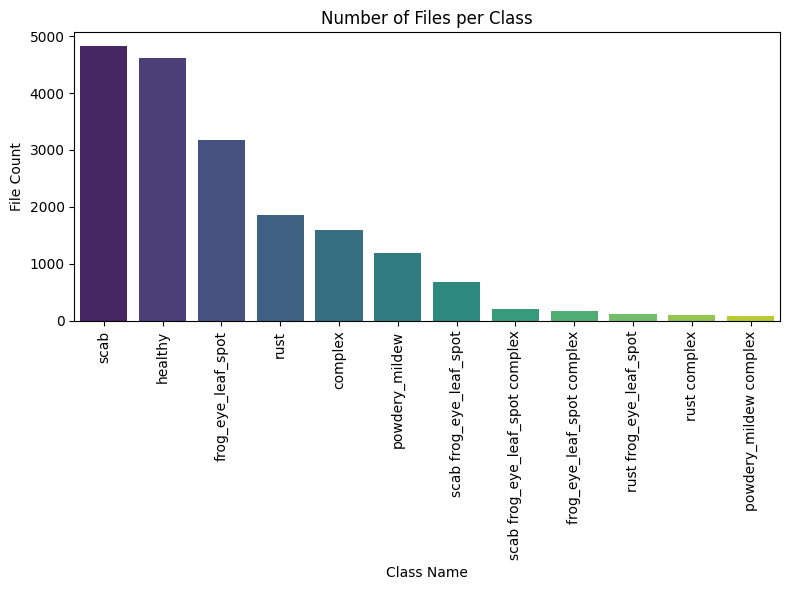

In [6]:
class_counts = visualize_class_distribution(train_df, meta_df, save_plot=True, plot_path="./imgs/total_class_dist.png")
print(class_counts)

Plot saved as ./imgs/sample_healthy.png
Plot saved as ./imgs/sample_scab frog_eye_leaf_spot complex.png
Plot saved as ./imgs/sample_scab.png
Plot saved as ./imgs/sample_complex.png
Plot saved as ./imgs/sample_rust.png
Plot saved as ./imgs/sample_frog_eye_leaf_spot.png
Plot saved as ./imgs/sample_powdery_mildew.png
Plot saved as ./imgs/sample_scab frog_eye_leaf_spot.png
Plot saved as ./imgs/sample_frog_eye_leaf_spot complex.png
Plot saved as ./imgs/sample_rust frog_eye_leaf_spot.png
Plot saved as ./imgs/sample_powdery_mildew complex.png
Plot saved as ./imgs/sample_rust complex.png


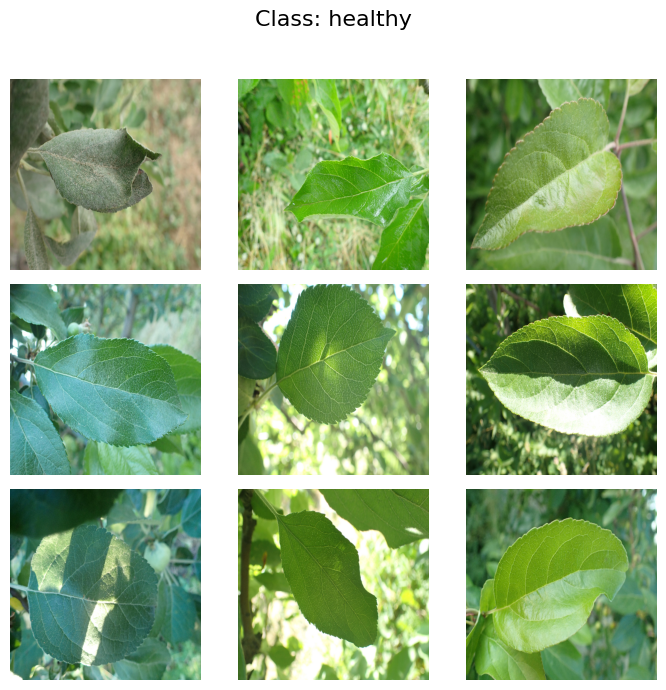

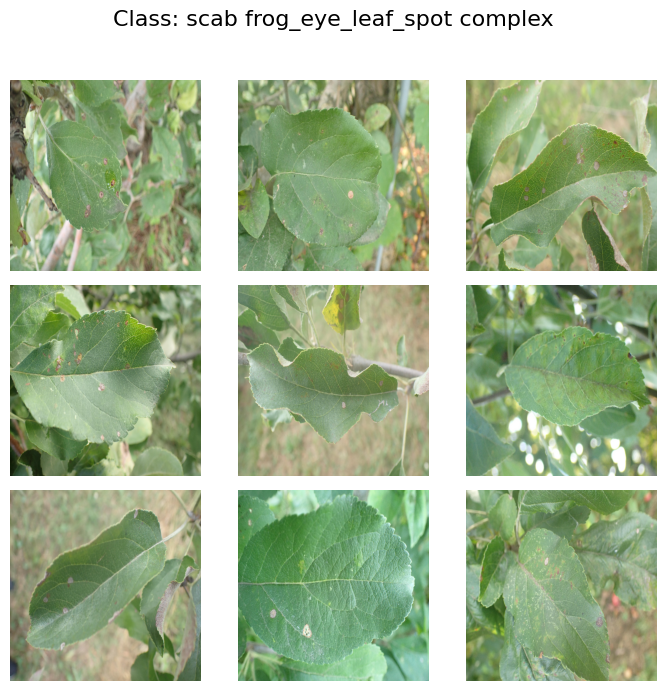

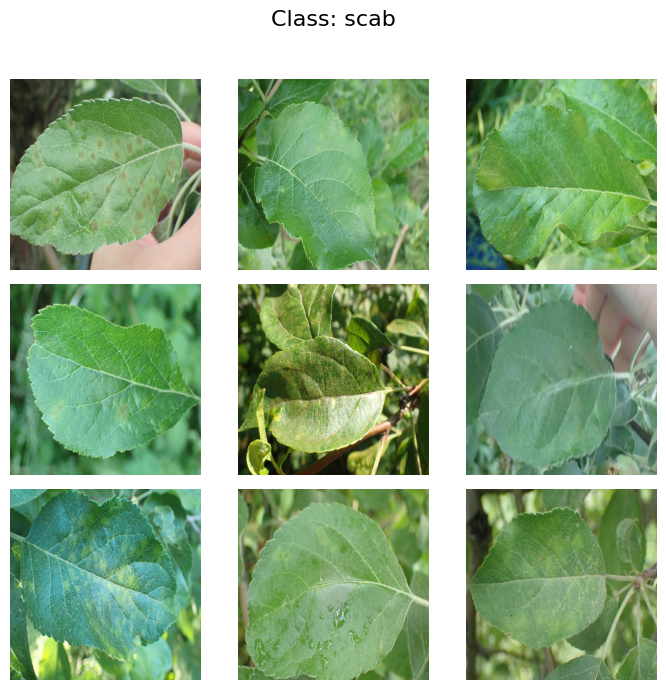

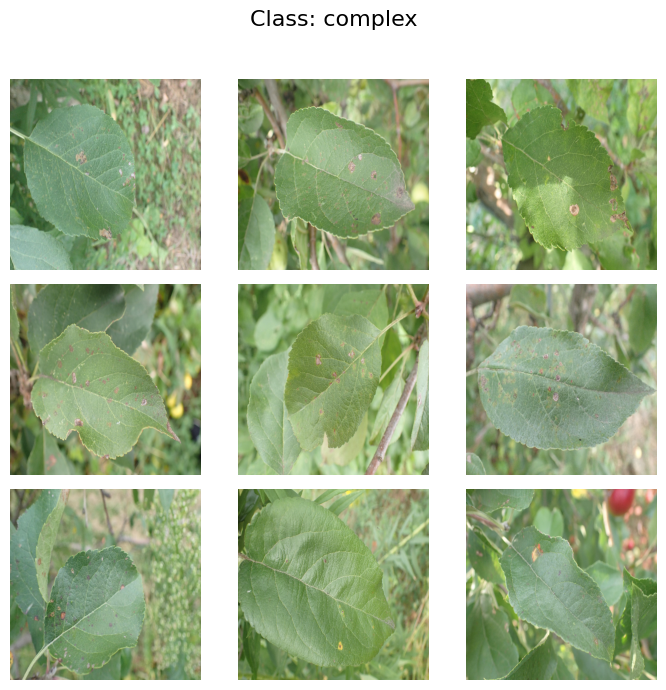

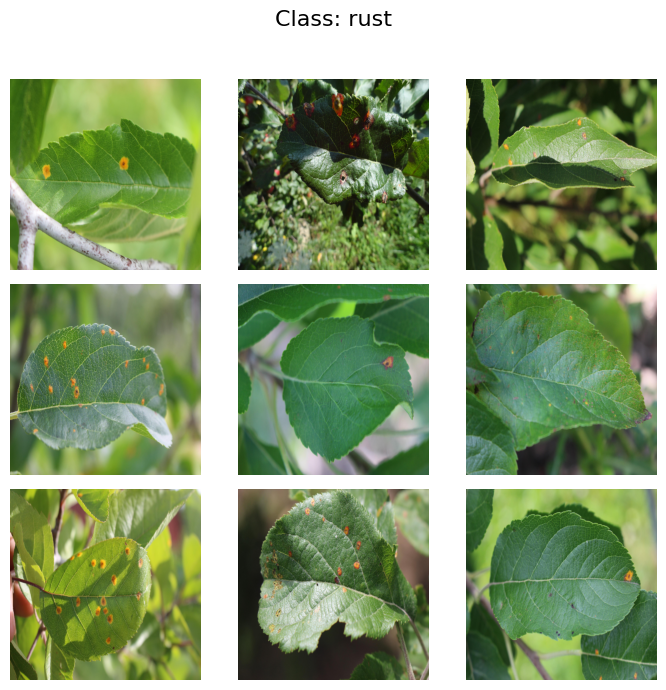

...

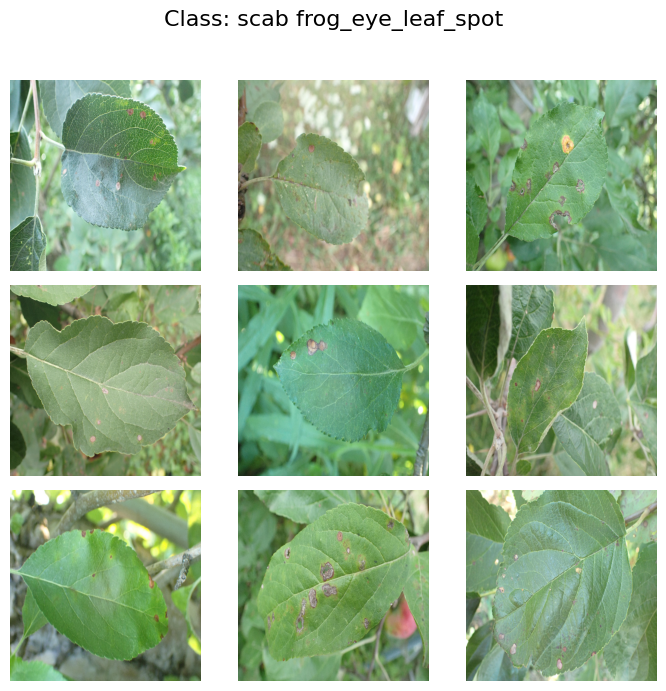

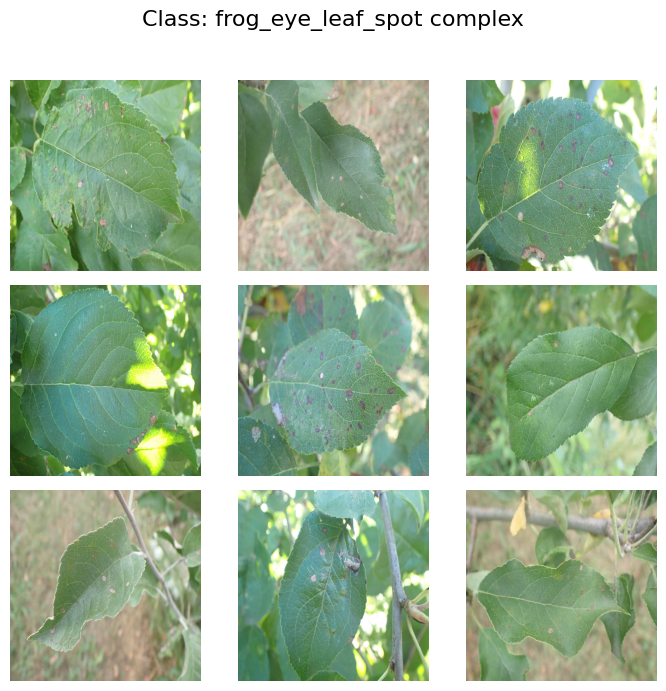

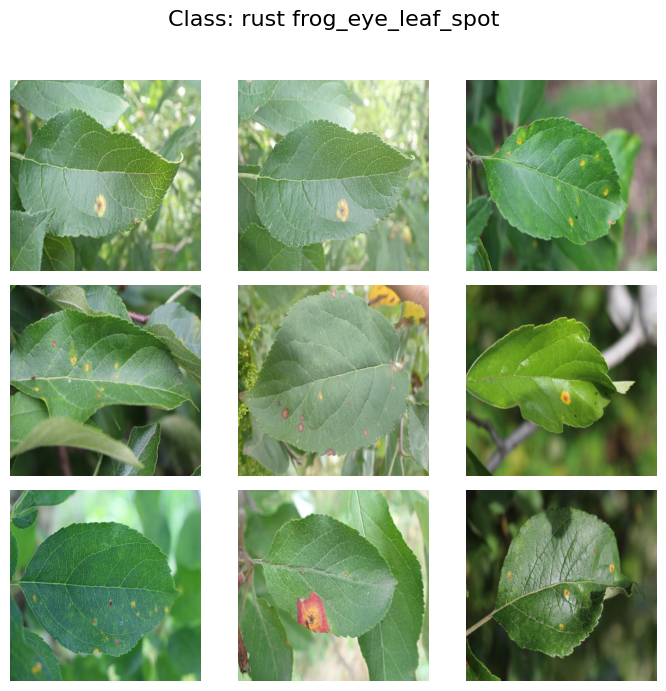

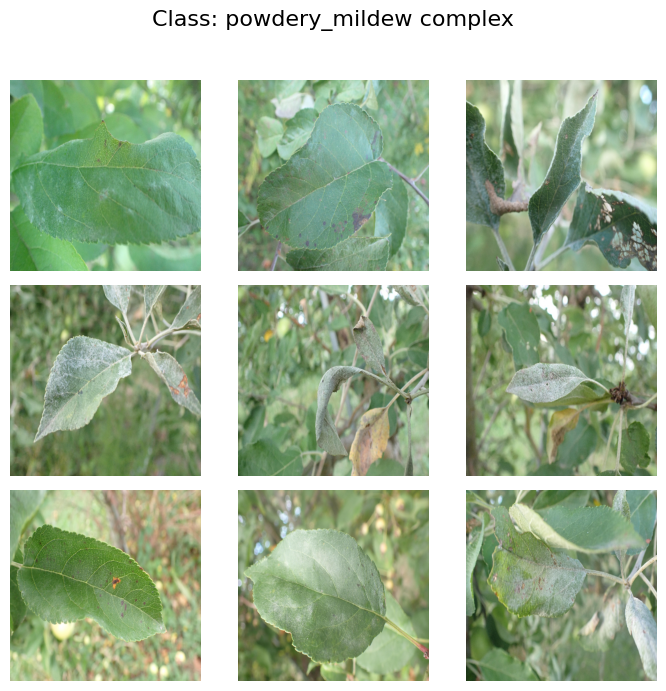

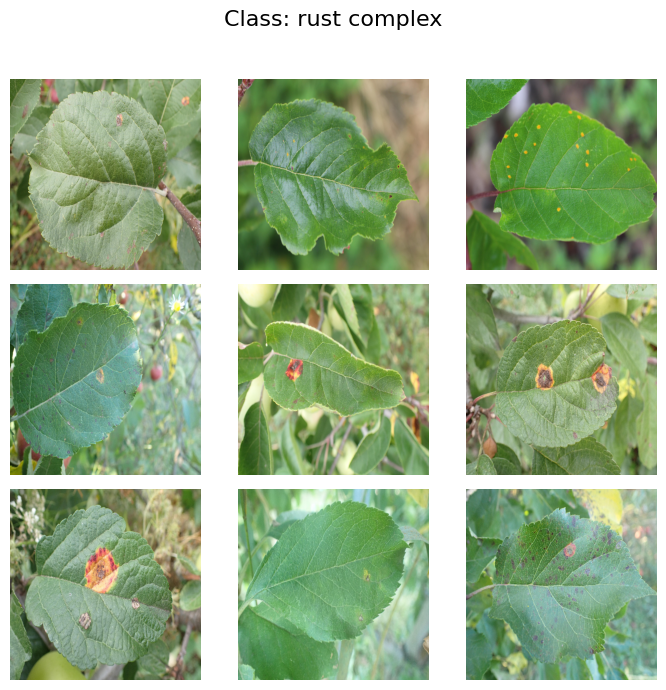

In [7]:
visualize_class_images(train_df, meta_df, data_path=f"{data_path}/train", save_plot=True, plot_path="./imgs/sample.png")

In [8]:
import os
import cv2
import copy
import numpy as np
import pandas as pd
import albumentations as A
import matplotlib.pyplot as plt

In [9]:
data_path = "/home/pervinco/Datasets/plant-pathology"
image_path = f"{data_path}/train"

train_df = pd.read_csv(f"{data_path}/train.csv")
meta_df = pd.read_csv(f"{data_path}/meta.csv")

In [10]:
meta_df['class_name'].unique()

array(['healthy', 'scab frog_eye_leaf_spot complex', 'scab', 'complex',
       'rust', 'frog_eye_leaf_spot', 'powdery_mildew',
       'scab frog_eye_leaf_spot', 'frog_eye_leaf_spot complex',
       'rust frog_eye_leaf_spot', 'powdery_mildew complex',
       'rust complex'], dtype=object)

In [11]:
classes = list(meta_df['class_name'].unique())
print(classes)

files = train_df['ID'].to_list()
labels = train_df['target'].to_list()
print(len(files), len(labels))

['healthy', 'scab frog_eye_leaf_spot complex', 'scab', 'complex', 'rust', 'frog_eye_leaf_spot', 'powdery_mildew', 'scab frog_eye_leaf_spot', 'frog_eye_leaf_spot complex', 'rust frog_eye_leaf_spot', 'powdery_mildew complex', 'rust complex']
18632 18632


8002cb321f8bfcdf.jpg 1
/home/pervinco/Datasets/plant-pathology/train/8002cb321f8bfcdf.jpg


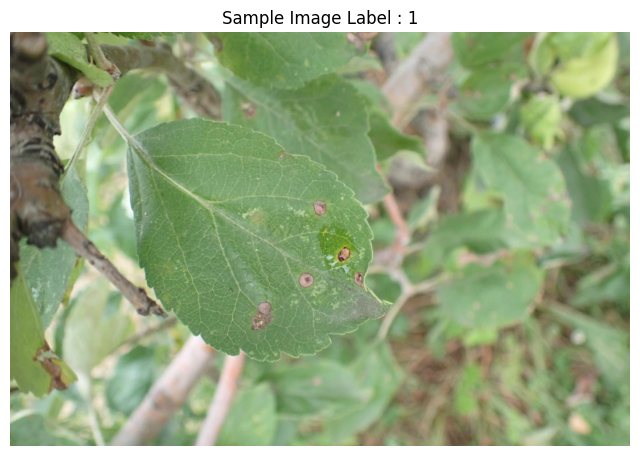

In [12]:
sample_idx = 1
sample_file, sample_label = files[sample_idx], labels[sample_idx]
print(sample_file, sample_label)

sample_file = f"{image_path}/{sample_file}"
print(sample_file)
sample_image = cv2.imread(sample_file)

sample_image_rgb = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(8, 6))
plt.imshow(sample_image_rgb)
plt.title(f"Sample Image Label : {sample_label}")
plt.axis('off')
plt.show()

In [13]:
img_size = 640

transforms = A.Compose([
    A.OneOf([
        A.Resize(img_size, img_size, p=0.5),
        A.RandomResizedCrop(img_size, img_size, p=0.5)
    ], p=1),
    A.RandomBrightnessContrast(brightness_limit=(-0.25, 0.25), contrast_limit=(-0.25, 0.25), p=1),

    A.Rotate(limit=(-90, 90), border_mode=0),
    
    A.OneOf([
        A.ElasticTransform(border_mode=0, p=0.5),
        A.OpticalDistortion(border_mode=0, p=0.5)
    ], p=0.5),
    
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),

    A.OneOf([
        A.Blur(blur_limit=(3, 5), p=0.33),
        A.GaussianBlur(blur_limit=(3, 5), p=0.33),
        A.MotionBlur(blur_limit=(3, 5), p=0.33)
    ], p=0.5)
])

(640, 640, 3)


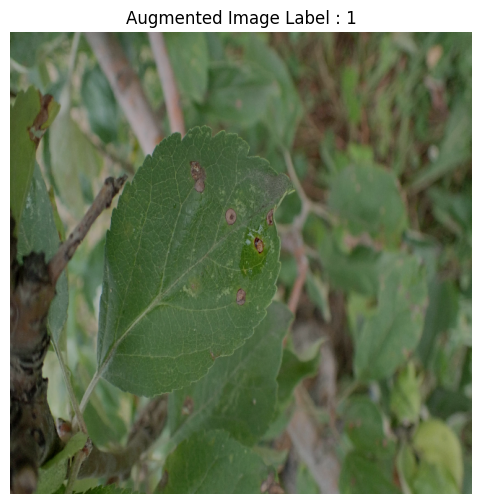

In [14]:
aug_image = transforms(image=sample_image)['image']
aug_image = cv2.cvtColor(aug_image, cv2.COLOR_BGR2RGB)
print(aug_image.shape)

plt.figure(figsize=(8, 6))
plt.imshow(aug_image)
plt.title(f"Augmented Image Label : {sample_label}")
plt.axis('off')
plt.show()

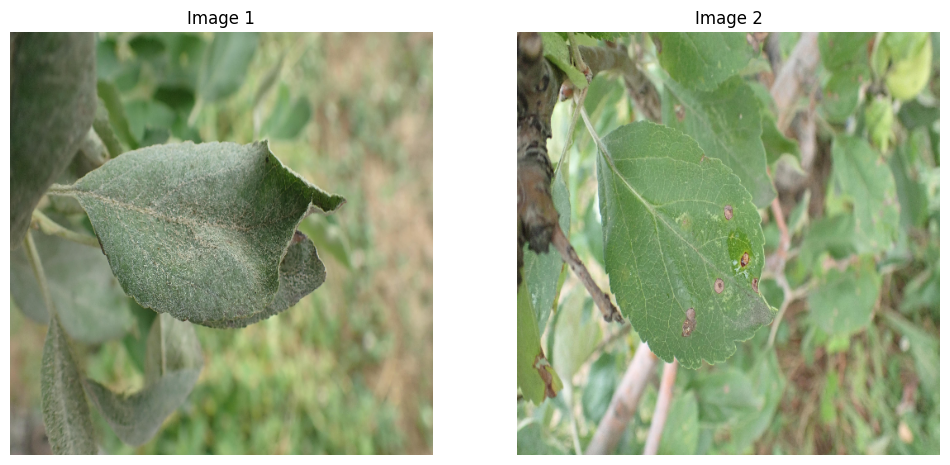

In [15]:
sample_file, label1 = files[0], labels[0]
sample_file = f"{image_path}/{sample_file}"
image1 = cv2.imread(sample_file)
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image1 = cv2.resize(image1, (512, 512))

sample_file, label2 = files[1], labels[1]
sample_file = f"{image_path}/{sample_file}"
image2 = cv2.imread(sample_file)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
image2 = cv2.resize(image2, (512, 512))

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image1)
plt.title(f"Image 1")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(image2)
plt.title(f"Image 2")
plt.axis('off')

plt.show()

In [16]:
def rand_bbox(size, lam):
    W = size[1]
    H = size[0]
    cut_rat = np.sqrt(1. - lam)
    cut_w = int(W * cut_rat)
    cut_h = int(H * cut_rat)

    cx = np.random.randint(W)
    cy = np.random.randint(H)

    bbx1 = np.clip(cx - cut_w // 2, 0, W)
    bby1 = np.clip(cy - cut_h // 2, 0, H)
    bbx2 = np.clip(cx + cut_w // 2, 0, W)
    bby2 = np.clip(cy + cut_h // 2, 0, H)

    return bbx1, bby1, bbx2, bby2


def cutmix(image1, image2, label1, label2, alpha=1.0):
    lam = np.random.beta(alpha, alpha)
    bbx1, bby1, bbx2, bby2 = rand_bbox(image1.shape, lam)
    
    image1[bbx1:bbx2, bby1:bby2, :] = image2[bbx1:bbx2, bby1:bby2, :]
    label = lam * label1 + (1 - lam) * label2
    
    return image1, label

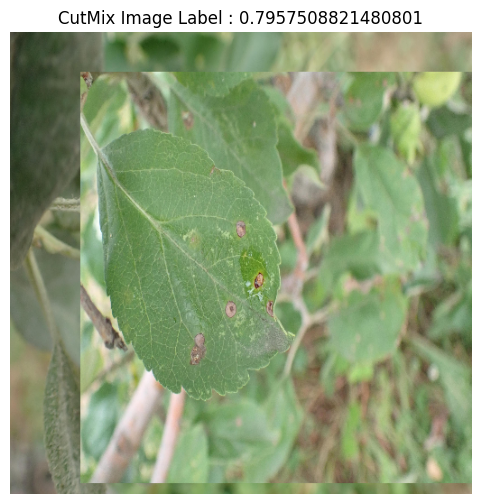

In [17]:
cutmix_img, cutmix_label = cutmix(copy.deepcopy(image1), copy.deepcopy(image2), label1, label2)

plt.figure(figsize=(8, 6))
plt.imshow(cutmix_img)
plt.title(f"CutMix Image Label : {cutmix_label}")
plt.axis('off')
plt.show()

In [18]:
def mixup(image1, image2, label1, label2, alpha=1.0):
    # MixUp 비율을 랜덤하게 생성
    lam = np.random.beta(alpha, alpha)
    
    # 두 이미지를 MixUp 비율에 따라 섞음
    mixup_image = lam * image1 + (1 - lam) * image2
    
    # 라벨도 동일한 비율로 섞음
    mixup_label = lam * label1 + (1 - lam) * label2
    
    # 섞인 이미지를 uint8 형식으로 변환
    mixup_image = mixup_image.astype(np.uint8)
    
    return mixup_image, mixup_label

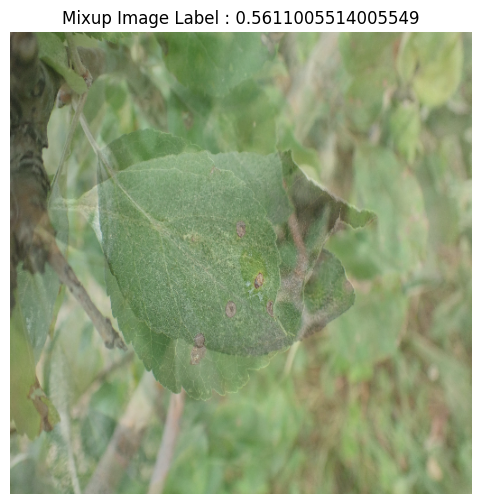

In [29]:
mixup_img, mixup_label = mixup(copy.deepcopy(image1), copy.deepcopy(image2), label1, label2, alpha=0.5)

plt.figure(figsize=(8, 6))
plt.imshow(mixup_img)
plt.title(f"Mixup Image Label : {mixup_label}")
plt.axis('off')
plt.show()

In [30]:
def cutout(image, mask_size, mask_color=(0, 0, 0)):
    h, w, _ = image.shape

    # 마스크의 좌표를 임의로 선택
    top = np.random.randint(0 - mask_size // 2, h - mask_size)
    left = np.random.randint(0 - mask_size // 2, w - mask_size)
    bottom = top + mask_size
    right = left + mask_size

    # 이미지의 복사본 생성
    cutout_image = image.copy()

    # 이미지 범위를 벗어나지 않도록 조정
    top = max(0, top)
    left = max(0, left)
    bottom = min(h, bottom)
    right = min(w, right)

    # 선택된 영역을 마스크 색상으로 채움
    cutout_image[top:bottom, left:right] = mask_color

    return cutout_image

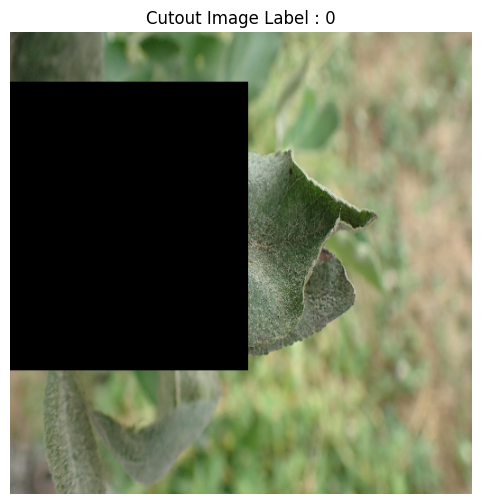

In [31]:
cutout_img = cutout(image1, img_size//2)

plt.figure(figsize=(8, 6))
plt.imshow(cutout_img)
plt.title(f"Cutout Image Label : {label1}")
plt.axis('off')
plt.show()

In [33]:
import random

random.random()

0.9319423898998704